Original størrelse: 262144 elementer


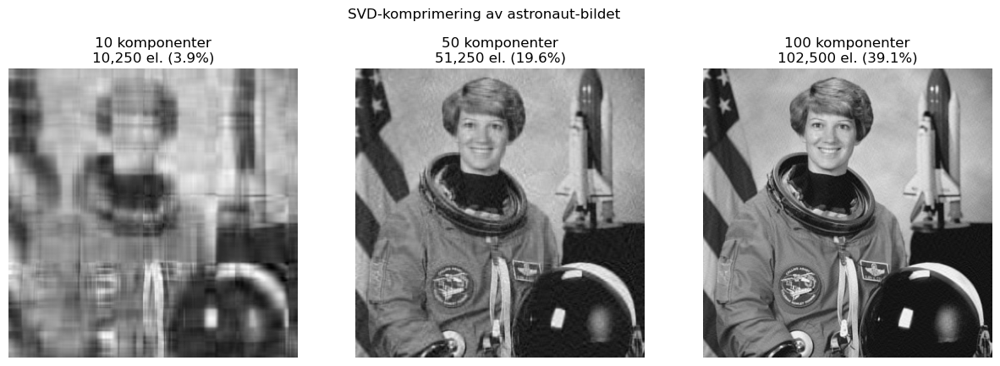

Original størrelse: 786432 elementer (m*n*c)


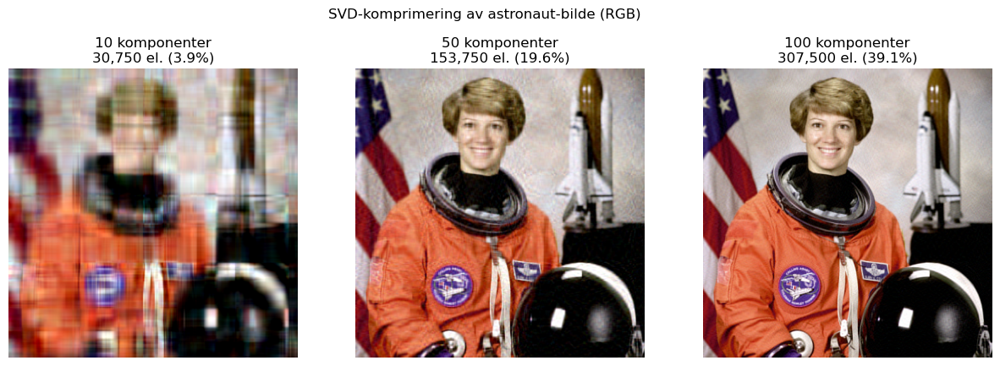

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Last inn bildet og konverter til gråskala
img = color.rgb2gray(data.astronaut())
m, n = img.shape
original_size = m * n
print(f"Original størrelse: {original_size} elementer")

# Beregn SVD
U, S, Vt = np.linalg.svd(img, full_matrices=False)

# Velg antall singularverdier
ks = [10, 50, 100]

plt.figure(figsize=(15,5))
for i, k in enumerate(ks, 1):
    # Rekonstruer bilde med k singularverdier
    img_k = U[:,:k] @ np.diag(S[:k]) @ Vt[:k,:]

    # Beregn minnebruk (U + S + Vt)
    mem_k = m*k + k + k*n
    mem_percent = mem_k / original_size * 100

    plt.subplot(1, len(ks), i)
    plt.imshow(img_k, cmap='gray')
    plt.axis('off')
    plt.title(f"{k} komponenter\n{mem_k:,} el. ({mem_percent:.1f}%)")

plt.suptitle("SVD-komprimering av astronaut-bildet")
plt.show()




import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Last inn bildet
img = data.astronaut()  # farget RGB bilde
m, n, c = img.shape
original_size = m * n * c
print(f"Original størrelse: {original_size} elementer (m*n*c)")

# Velg antall singularverdier
ks = [10, 50, 100]

plt.figure(figsize=(15,5))

for i, k in enumerate(ks, 1):
    img_k = np.zeros_like(img, dtype=float)
    mem_total = 0
    # SVD per kanal
    for ch in range(c):
        U, S, Vt = np.linalg.svd(img[:,:,ch], full_matrices=False)
        img_k[:,:,ch] = U[:,:k] @ np.diag(S[:k]) @ Vt[:k,:]
        # Memory for denne kanalen
        mem_total += m*k + k + k*n

    mem_percent = mem_total / original_size * 100

    plt.subplot(1, len(ks), i)
    plt.imshow(np.clip(img_k/255, 0, 1))
    plt.axis('off')
    plt.title(f"{k} komponenter\n{mem_total:,} el. ({mem_percent:.1f}%)")

plt.suptitle("SVD-komprimering av astronaut-bilde (RGB)")
plt.show()


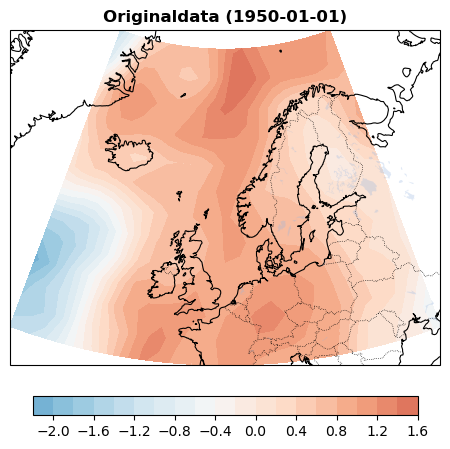

In [ ]:
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as sio

# ---------- LAST INN DATA ----------
filename = "Anvendelser_tempData.mat"  # Din fil
data = sio.loadmat(filename)

# Temperaturdata og koordinater
gt = data["t2mw"]           # shape: (tid, lat, lon)
lat = data["t2m_lat"].flatten()
lon = data["t2m_lon"].flatten()
lon = np.where(lon > 180, lon - 360, lon)

# Sorter longitudes og data etter ny rekkefølge
sort_idx = np.argsort(lon)
lon = lon[sort_idx]
gt = gt[:, :, sort_idx]

nt, nlat, nlon = gt.shape

# Lag 2D grids for plotting
lat2d = np.tile(lat[:, np.newaxis], (1, nlon))
lon2d = np.tile(lon[np.newaxis, :], (nlat, 1))


# Datoer
tw = data["tw"].flatten()

dates = np.array([
    dt.datetime.fromordinal(int(t))
    + dt.timedelta(days=float(t % 1))
    - dt.timedelta(days=366)
    for t in tw
])


# ---------- PREPROCESSING ----------
# Fokus på et geografisk område (Norskehavet)
xmin, xmax = -30, 35
ymin, ymax = 45, 75
res = 2.5


lat_idx = np.logical_and(lat >= ymin, lat <= ymax)
lon_idx = np.logical_and(lon >= xmin, lon <= xmax)

lat2dN = lat2d[lat_idx, :][:, lon_idx]
lon2dN = lon2d[lat_idx, :][:, lon_idx]
gtN = gt[:, lat_idx, :][:, :, lon_idx]

# Detrend og standardiser per punkt
from scipy import signal
gtN = signal.detrend(gtN, axis=0, type='linear')
for i in range(gtN.shape[1]):
    for j in range(gtN.shape[2]):
        gtN[:, i, j] /= np.std(gtN[:, i, j])



# Sett opp figur
fig, ax = plt.subplots(figsize=(6,5), subplot_kw={'projection': prj})
data_crs = ccrs.PlateCarree()

# Felles fargeskala
vmin = np.min(gtN)
vmax = np.max(gtN)

# Første frame
im = ax.contourf(lon2dN, lat2dN, gtN[0,:,:], cmap='RdBu_r', levels=21, transform=data_crs, vmin=vmin, vmax=vmax)
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
ax.add_feature(cfeature.LAKES, alpha=0.3)
fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.05, pad=0.08)
ax.set_title(f"Originaldata ({dates[0].strftime('%Y-%m-%d')})", fontsize=12, fontweight='bold')

# Oppdateringsfunksjon
def update_orig(frame):
    ax.clear()
    cs = ax.contourf(lon2dN, lat2dN, gtN[frame,:,:], cmap='RdBu_r', levels=21,
                     transform=data_crs, vmin=vmin, vmax=vmax)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.3)
    ax.set_title(f"Originaldata ({dates[frame].strftime('%Y-%m-%d')})", fontsize=12, fontweight='bold')
    return cs

# Lag animasjonen
ani_orig = animation.FuncAnimation(fig, update_orig, frames=range(0, nt, 1), interval=150, blit=False)

# Vis i Jupyter
from IPython.display import HTML
HTML(ani_orig.to_jshtml())

# Eller lagre som mp4:
# ani_orig.save("Original_Temp.mp4", writer="ffmpeg", dpi=200)


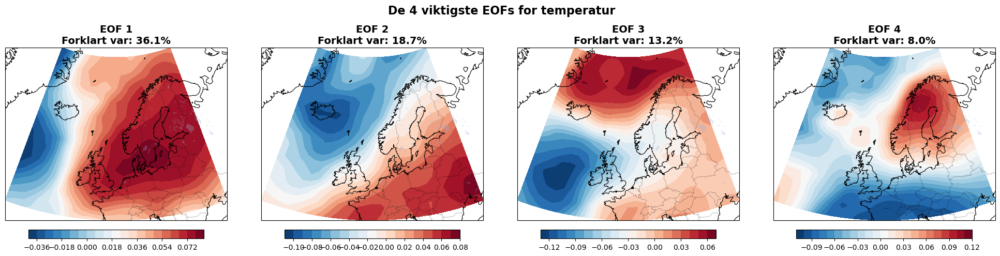

In [ ]:
# -*- coding: utf-8 -*-
"""
Forelesningsklar EOF-analyse av temperaturdata
"""


# ---------- SVD / EOF ----------
# Reshape til (tid, romlig)
D = gtN.reshape(nt, -1)
U, S, Vt = np.linalg.svd(D, full_matrices=False)

eigenvalues = S**2
cumvar = np.cumsum(eigenvalues) / np.sum(eigenvalues)

# Velg antall EOFs
k = 4
EOFs = np.array([Vt[i, :].reshape(gtN.shape[1], gtN.shape[2]) for i in range(k)])

# ---------- PLOTTING ----------

fs = 14
clon = (lon2dN.min() + lon2dN.max())/2
clat = (lat2dN.min() + lat2dN.max())/2
prj = ccrs.LambertConformal(central_latitude=clat, central_longitude=clon)
data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(1, k, figsize=(20,5), subplot_kw={'projection': prj})

for i, ax in enumerate(axes):
    cs = ax.contourf(lon2dN, lat2dN, EOFs[i], transform=data_crs,
                     cmap='RdBu_r', levels=21)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.3)
    ax.set_title(f"EOF {i+1}\nForklart var: {eigenvalues[i]/np.sum(eigenvalues):.1%}",
                 fontsize=fs, fontweight='bold')
    plt.colorbar(cs, ax=ax, orientation='horizontal', pad=0.05, fraction=0.046)

fig.suptitle("De 4 viktigste EOFs for temperatur", fontsize=fs+2, fontweight='bold')
fig.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


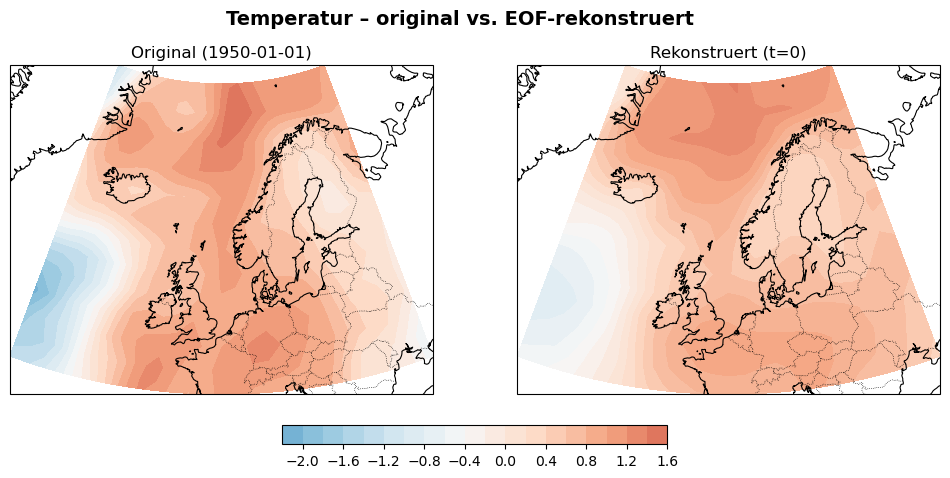

In [ ]:
import matplotlib.animation as animation
import datetime as dt
import numpy as np

# ---------- REKONSTRUKSJON FRA K EOFs ----------
k = 4  # antall EOF-komponenter du vil bruke
reconstructed = (U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]).reshape(gtN.shape)

# ---------- ANIMASJON ----------
fig, axs = plt.subplots(1, 2, figsize=(12, 5), subplot_kw={'projection': prj})
data_crs = ccrs.PlateCarree()

# Felles fargeskala
vmin = np.min(gtN)
vmax = np.max(gtN)

# Første bilde
im1 = axs[0].contourf(lon2dN, lat2dN, gtN[0,:,:], cmap='RdBu_r', levels=21, transform=data_crs, vmin=vmin, vmax=vmax)
im2 = axs[1].contourf(lon2dN, lat2dN, reconstructed[0,:,:], cmap='RdBu_r', levels=21, transform=data_crs, vmin=vmin, vmax=vmax)

for ax, title in zip(axs, ["Original data", f"Rekonstruert ({k} EOFs)"]):
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.3)
    ax.set_title(title, fontsize=12, fontweight='bold')

fig.colorbar(im1, ax=axs, orientation='horizontal', fraction=0.05, pad=0.08)
fig.suptitle("Temperatur – original vs. EOF-rekonstruert", fontsize=14, fontweight='bold')

# Oppdateringsfunksjon
def update(frame):
    for ax in axs:
        ax.clear()

    # Original
    cs1 = axs[0].contourf(lon2dN, lat2dN, gtN[frame,:,:], cmap='RdBu_r', levels=21, transform=data_crs, vmin=vmin, vmax=vmax)
    axs[0].add_feature(cfeature.COASTLINE, linewidth=0.8)
    axs[0].add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    axs[0].set_title(f"Original ({dates[frame].strftime('%Y-%m-%d')})")


    # Rekonstruert
    cs2 = axs[1].contourf(lon2dN, lat2dN, reconstructed[frame,:,:], cmap='RdBu_r', levels=21, transform=data_crs, vmin=vmin, vmax=vmax)
    axs[1].add_feature(cfeature.COASTLINE, linewidth=0.8)
    axs[1].add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    axs[1].set_title(f"Rekonstruert ({dates[frame].strftime('%Y-%m-%d')})")

    return [cs1, cs2]

# Lag animasjonen
ani = animation.FuncAnimation(fig, update, frames=range(0, nt, 1), interval=150, blit=False)

# Hvis du kjører i Jupyter:
from IPython.display import HTML
HTML(ani.to_jshtml())

# Eller lagre som mp4 (krever ffmpeg):
# ani.save("EOF_animation.mp4", writer="ffmpeg", dpi=200)


(1, 58)
[[712224 712589 712954 713320 713685 714050 714415 714781 715146 715511
  715876 716242 716607 716972 717337 717703 718068 718433 718798 719164
  719529 719894 720259 720625 720990 721355 721720 722086 722451 722816
  723181 723547 723912 724277 724642 725008 725373 725738 726103 726469
  726834 727199 727564 727930 728295 728660 729025 729391 729756 730121
  730486 730852 731217 731582 731947 732313 732678 733043]]
